In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
df = pd.read_csv(r"C:\Users\itsme\OneDrive\Documents\EAB\rideshare_kaggle.csv")
df.shape

(693071, 57)

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 693071 entries, 0 to 693070
Data columns (total 57 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   id                           693071 non-null  object 
 1   timestamp                    693071 non-null  float64
 2   hour                         693071 non-null  int64  
 3   day                          693071 non-null  int64  
 4   month                        693071 non-null  int64  
 5   datetime                     693071 non-null  object 
 6   timezone                     693071 non-null  object 
 7   source                       693071 non-null  object 
 8   destination                  693071 non-null  object 
 9   cab_type                     693071 non-null  object 
 10  product_id                   693071 non-null  object 
 11  name                         693071 non-null  object 
 12  price                        637976 non-null  float64
 13 

In [4]:
df = df.drop(columns=['timezone','product_id', 'latitude', 'longitude', 'id','sunriseTime','sunsetTime','moonPhase','precipIntensityMax','uvIndexTime','temperatureMinTime','temperatureMaxTime', 'apparentTemperatureMinTime','apparentTemperatureMaxTime'])
df.shape

(693071, 43)

In [5]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler, StandardScaler

# Assuming 'df' is your DataFrame
numeric_cols = df.select_dtypes(include=[float, int]).columns
data = df[numeric_cols].values  # Select only numeric columns

# Reshape the data to make it 2D
data = data.reshape(-1, 1)

# Min-Max Scaling
min_max_scaler = MinMaxScaler()
min_max_scaled_data = min_max_scaler.fit_transform(data)

print("Min-Max Scaled Data:")
print(min_max_scaled_data)

# Z-score (Standardization) Scaling
standard_scaler = StandardScaler()
standard_scaled_data = standard_scaler.fit_transform(data)

print("\nStandardized Data:")
print(standard_scaled_data)


Min-Max Scaled Data:
[[9.99826438e-01]
 [5.82441034e-09]
 [1.03545073e-08]
 ...
 [2.89667341e-08]
 [1.79715417e-08]
 [2.85331391e-08]]

Standardized Data:
[[ 2.19699107]
 [-0.45548358]
 [-0.45548357]
 ...
 [-0.45548352]
 [-0.45548355]
 [-0.45548352]]


In [6]:
df.dropna(subset=['price'], inplace=True)

In [7]:
df['timestamp'] = pd.to_datetime(df['timestamp'], unit='s')

In [8]:
df.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 637976 entries, 0 to 693070
Data columns (total 43 columns):
 #   Column                       Non-Null Count   Dtype         
---  ------                       --------------   -----         
 0   timestamp                    637976 non-null  datetime64[ns]
 1   hour                         637976 non-null  int64         
 2   day                          637976 non-null  int64         
 3   month                        637976 non-null  int64         
 4   datetime                     637976 non-null  object        
 5   source                       637976 non-null  object        
 6   destination                  637976 non-null  object        
 7   cab_type                     637976 non-null  object        
 8   name                         637976 non-null  object        
 9   price                        637976 non-null  float64       
 10  distance                     637976 non-null  float64       
 11  surge_multiplier          

In [9]:
import pandas as pd

# Assuming 'your_datetime_column' is the column with datetime values
# Replace 'your_datetime_column' with the actual column name in your DataFrame
df['datetime'] = pd.to_datetime(df['datetime'])

# Creating new columns for date and time
df['date'] = df['datetime'].dt.date
df['time'] = df['datetime'].dt.time

# Drop the original datetime column if needed
# df = df.drop(columns=['your_datetime_column'])

# Display the modified DataFrame
print(df)


                           timestamp  hour  day  month            datetime  \
0      2018-12-16 09:30:07.890000128     9   16     12 2018-12-16 09:30:07   
1      2018-11-27 02:00:23.676999936     2   27     11 2018-11-27 02:00:23   
2      2018-11-28 01:00:22.197999872     1   28     11 2018-11-28 01:00:22   
3      2018-11-30 04:53:02.749000192     4   30     11 2018-11-30 04:53:02   
4      2018-11-29 03:49:20.223000064     3   29     11 2018-11-29 03:49:20   
...                              ...   ...  ...    ...                 ...   
693065 2018-12-01 23:53:06.000000000    23    1     12 2018-12-01 23:53:05   
693066 2018-12-01 23:53:06.000000000    23    1     12 2018-12-01 23:53:05   
693067 2018-12-01 23:53:06.000000000    23    1     12 2018-12-01 23:53:05   
693069 2018-12-01 23:53:06.000000000    23    1     12 2018-12-01 23:53:05   
693070 2018-12-01 23:53:06.000000000    23    1     12 2018-12-01 23:53:05   

                  source    destination cab_type          name 

In [10]:
pip install seaborn


Note: you may need to restart the kernel to use updated packages.


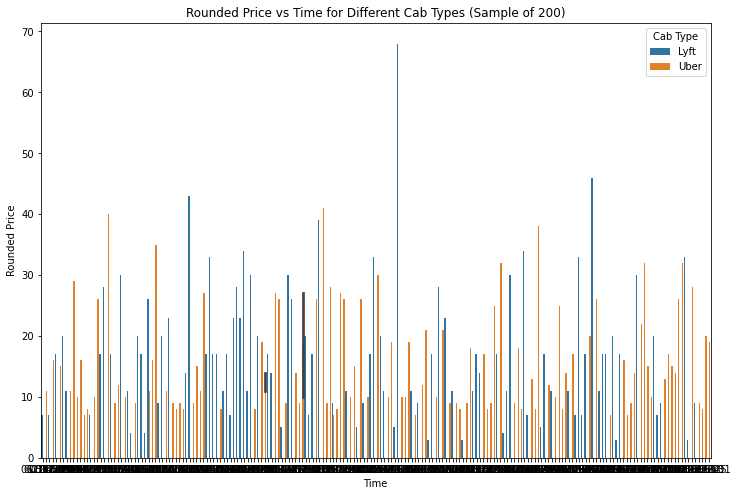

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Assuming 'time', 'cab_type', and 'rounded_price' are the column names in your DataFrame
time = 'time'
cab_type = 'cab_type'
rounded_price = 'rounded_price'

# Round up the 'price' column
df['rounded_price'] = np.ceil(df['price'])

# Randomly select 200 values
df_sample = df.sample(n=200, random_state=42)  # Adjust random_state for reproducibility

# Plotting the graph
plt.figure(figsize=(12, 8))
sns.barplot(x=time, y=rounded_price, hue=cab_type, data=df_sample)
plt.title('Rounded Price vs Time for Different Cab Types (Sample of 200)')
plt.xlabel('Time')
plt.ylabel('Rounded Price')
plt.legend(title='Cab Type', loc='upper right')
plt.show()


NameError: name 'skewness_price' is not defined

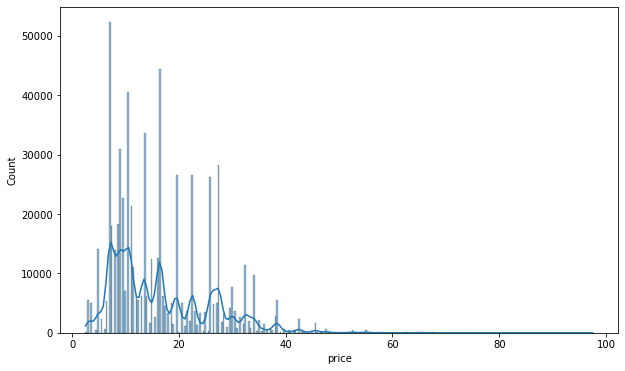

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'price' is the column of interest in your DataFrame df
price = 'price'

# Plotting the histogram
plt.figure(figsize=(10, 6))
sns.histplot(df[price], kde=True)
plt.title(f'Distribution of {price} with Skewness: {skewness_price:.2f}')
plt.xlabel(price)
plt.ylabel('Frequency')
plt.show()


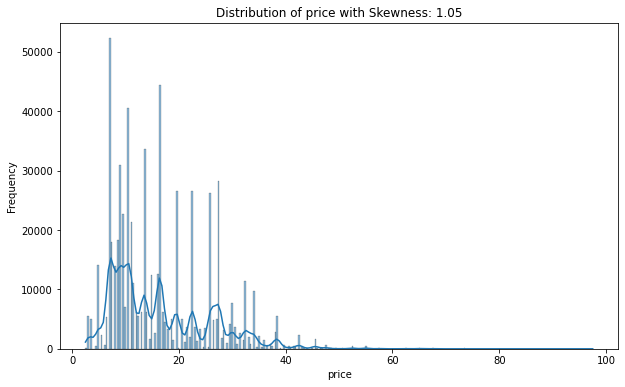

In [15]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import skew

# Assuming 'df' is your DataFrame and 'price' is the column you are interested in
price = 'price'  # Replace with your actual column name
skewness_price = skew(df[price].dropna())  # Calculate skewness

plt.figure(figsize=(10, 6))
sns.histplot(df[price], kde=True)
plt.title(f'Distribution of {price} with Skewness: {skewness_price:.2f}')
plt.xlabel(price)
plt.ylabel('Frequency')
plt.show()


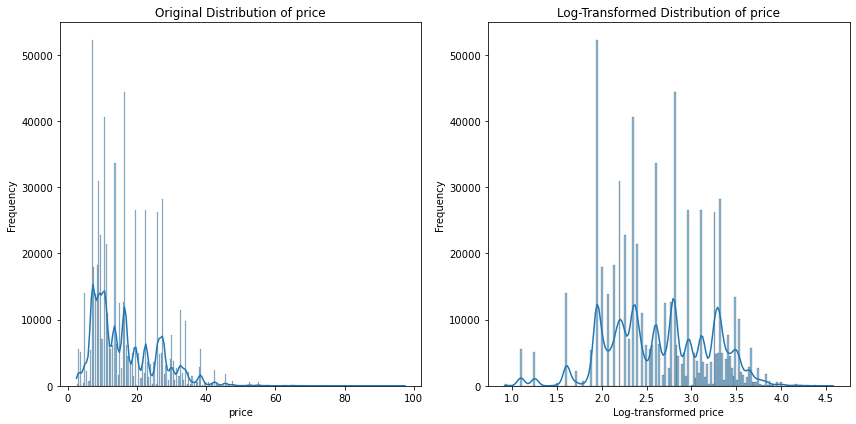

In [16]:
import numpy as np
import pandas as pd

# Assuming 'df' is your DataFrame and 'price' is the column you want to log transform
price = 'price'  # Replace with your actual column name

# Check for non-positive values before log transformation
if (df[price] <= 0).any():
    print("Warning: Log transformation is not defined for non-positive values. Handle them accordingly.")

# Log transformation
df['log_transformed_price'] = np.log(df[price])

# Plot the original and log-transformed data for comparison
plt.figure(figsize=(12, 6))

# Original distribution
plt.subplot(1, 2, 1)
sns.histplot(df[price].dropna(), kde=True)
plt.title(f'Original Distribution of {price}')
plt.xlabel(price)
plt.ylabel('Frequency')

# Log-transformed distribution
plt.subplot(1, 2, 2)
sns.histplot(df['log_transformed_price'].dropna(), kde=True)
plt.title(f'Log-Transformed Distribution of {price}')
plt.xlabel('Log-transformed ' + price)
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


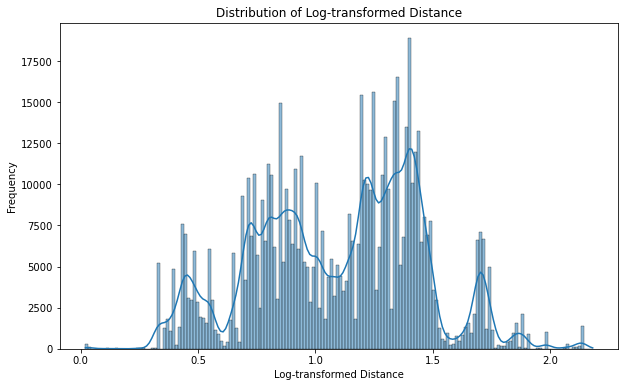

In [17]:
import pandas as pd
import numpy as np

# Assuming your DataFrame is named df and "distance" is the variable of interest
df['log_distance'] = np.log1p(df['distance'].dropna())

# Plotting the log-transformed variable
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.histplot(df['log_distance'], kde=True)
plt.title('Distribution of Log-transformed Distance')
plt.xlabel('Log-transformed Distance')
plt.ylabel('Frequency')
plt.show()


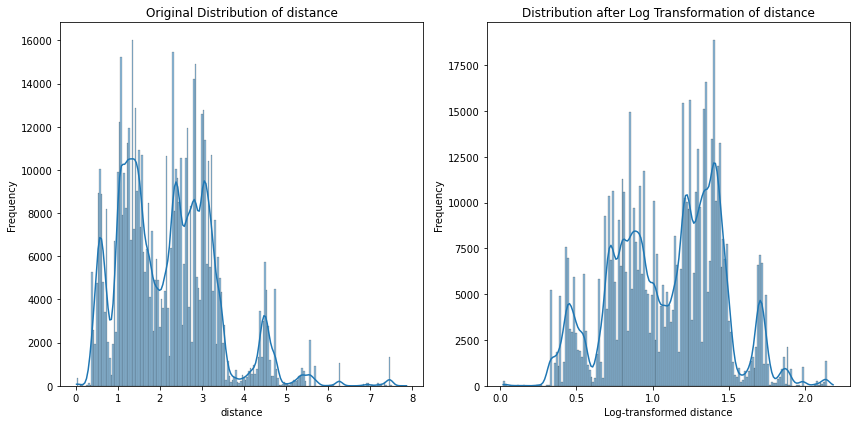

In [18]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming your DataFrame is named df and "distance" is the variable of interest
distance_column = 'distance'

# Plotting the original distribution
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.histplot(df[distance_column].dropna(), kde=True)
plt.title(f'Original Distribution of {distance_column}')
plt.xlabel(distance_column)
plt.ylabel('Frequency')

# Log transformation
df['log_distance'] = np.log1p(df[distance_column].dropna())

# Plotting the distribution after log transformation
plt.subplot(1, 2, 2)
sns.histplot(df['log_distance'], kde=True)
plt.title(f'Distribution after Log Transformation of {distance_column}')
plt.xlabel('Log-transformed ' + distance_column)
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


In [19]:
from sklearn.preprocessing import MinMaxScaler

# Select only numeric columns for scaling
numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns

# Exclude non-numeric columns
columns_to_scale = [col for col in numeric_columns if col not in ['id', 'timestamp', 'source', 'destination', 'cab_type', 'product_id', 'name', 'icon']]

# Initialize the MinMaxScaler
scaler = MinMaxScaler()

# Apply Min-Max scaling to the selected columns
df[columns_to_scale] = scaler.fit_transform(df[columns_to_scale])

# Display the scaled DataFrame
print("Scaled DataFrame:")
print(df.head())


Scaled DataFrame:
                      timestamp      hour       day  month  \
0 2018-12-16 09:30:07.890000128  0.391304  0.517241    1.0   
1 2018-11-27 02:00:23.676999936  0.086957  0.896552    0.0   
2 2018-11-28 01:00:22.197999872  0.043478  0.931034    0.0   
3 2018-11-30 04:53:02.749000192  0.173913  1.000000    0.0   
4 2018-11-29 03:49:20.223000064  0.130435  0.965517    0.0   

             datetime            source    destination cab_type          name  \
0 2018-12-16 09:30:07  Haymarket Square  North Station     Lyft        Shared   
1 2018-11-27 02:00:23  Haymarket Square  North Station     Lyft           Lux   
2 2018-11-28 01:00:22  Haymarket Square  North Station     Lyft          Lyft   
3 2018-11-30 04:53:02  Haymarket Square  North Station     Lyft  Lux Black XL   
4 2018-11-29 03:49:20  Haymarket Square  North Station     Lyft       Lyft XL   

      price  ...     ozone  temperatureMin  temperatureMax  \
0  0.026316  ...  0.314155        0.883145        0.417488  

In [20]:
import pandas as pd

# Separate Uber values
uber_data = df[df['cab_type'] == 'Uber'][['cab_type', 'price']]

# Separate Lyft values
lyft_data = df[df['cab_type'] == 'Lyft'][['cab_type', 'price']]

# Print the results
print("Uber Data:")
print(uber_data.head())

print("\nLyft Data:")
print(lyft_data.head())


Uber Data:
   cab_type     price
12     Uber  0.100000
13     Uber  0.142105
14     Uber  0.052632
15     Uber  0.052632
16     Uber  0.247368

Lyft Data:
  cab_type     price
0     Lyft  0.026316
1     Lyft  0.089474
2     Lyft  0.047368
3     Lyft  0.247368
4     Lyft  0.068421


In [21]:
import pandas as pd

# Assuming your DataFrame is named 'df'
# Replace 'your_dataset.csv' with your actual dataset file
# df = pd.read_csv('your_dataset.csv')

# Filter Uber data
uber_data = df[df['cab_type'] == 'Uber']

# Filter Lyft data
lyft_data = df[df['cab_type'] == 'Lyft']

# Group by source and destination, calculate mean price for Uber and Lyft
uber_avg_prices = uber_data.groupby(['source', 'destination'])['price'].mean().reset_index()
lyft_avg_prices = lyft_data.groupby(['source', 'destination'])['price'].mean().reset_index()

# Merge the two DataFrames on source and destination columns
merged_data = pd.merge(uber_avg_prices, lyft_avg_prices, on=['source', 'destination'], suffixes=('_Uber', '_Lyft'))

# Print the comparison
print("Comparison of Uber and Lyft Prices by Source and Destination:")
print(merged_data)


Comparison of Uber and Lyft Prices by Source and Destination:
      source              destination  price_Uber  price_Lyft
0   Back Bay        Boston University    0.112818    0.130852
1   Back Bay                   Fenway    0.108898    0.126621
2   Back Bay         Haymarket Square    0.154429    0.172363
3   Back Bay                North End    0.168701    0.189322
4   Back Bay  Northeastern University    0.106273    0.118346
..       ...                      ...         ...         ...
67  West End                   Fenway    0.153042    0.172479
68  West End         Haymarket Square    0.107341    0.108966
69  West End                North End    0.114198    0.114659
70  West End  Northeastern University    0.165299    0.181958
71  West End            South Station    0.125411    0.138713

[72 rows x 4 columns]


TypeError: matplotlib.axes._axes.Axes.barh() got multiple values for keyword argument 'label'

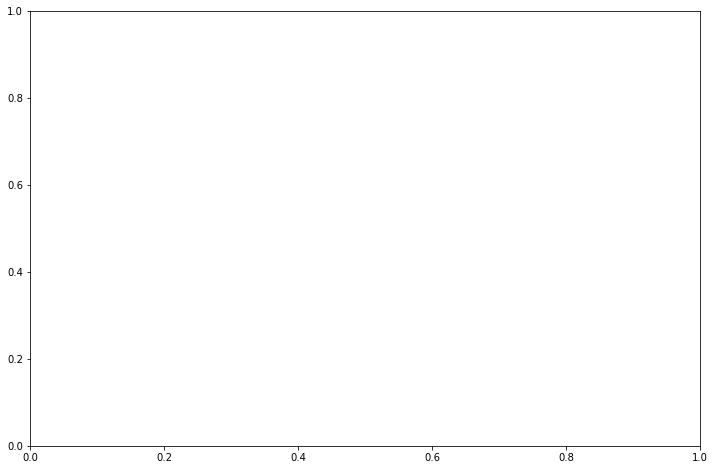

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'merged_data' is the DataFrame containing Uber and Lyft price comparison
# Replace 'your_dataset.csv' with your actual dataset file
# merged_data = pd.read_csv('your_dataset.csv')

# Set the figure size
plt.figure(figsize=(12, 8))

# Create a bar plot for Uber prices
sns.barplot(x='price_Uber', y='source', hue='destination', data=merged_data, label='Uber', color='blue')

# Create a bar plot for Lyft prices
sns.barplot(x='price_Lyft', y='source', hue='destination', data=merged_data, label='Lyft', color='orange')

# Set labels and title
plt.xlabel('Average Price')
plt.ylabel('Source')
plt.title('Comparison of Uber and Lyft Prices by Source and Destination')

# Show legend
plt.legend()

# Show the plot
plt.show()


In [23]:
merged_data

,source,destination,price_Uber,price_Lyft
0,Back Bay,Boston University,0.112818,0.130852
1,Back Bay,Fenway,0.108898,0.126621
2,Back Bay,Haymarket Square,0.154429,0.172363
3,Back Bay,North End,0.168701,0.189322
4,Back Bay,Northeastern University,0.106273,0.118346
...,...,...,...,...
67,West End,Fenway,0.153042,0.172479
68,West End,Haymarket Square,0.107341,0.108966
69,West End,North End,0.114198,0.114659
70,West End,Northeastern University,0.165299,0.181958


<AxesSubplot:ylabel='source'>

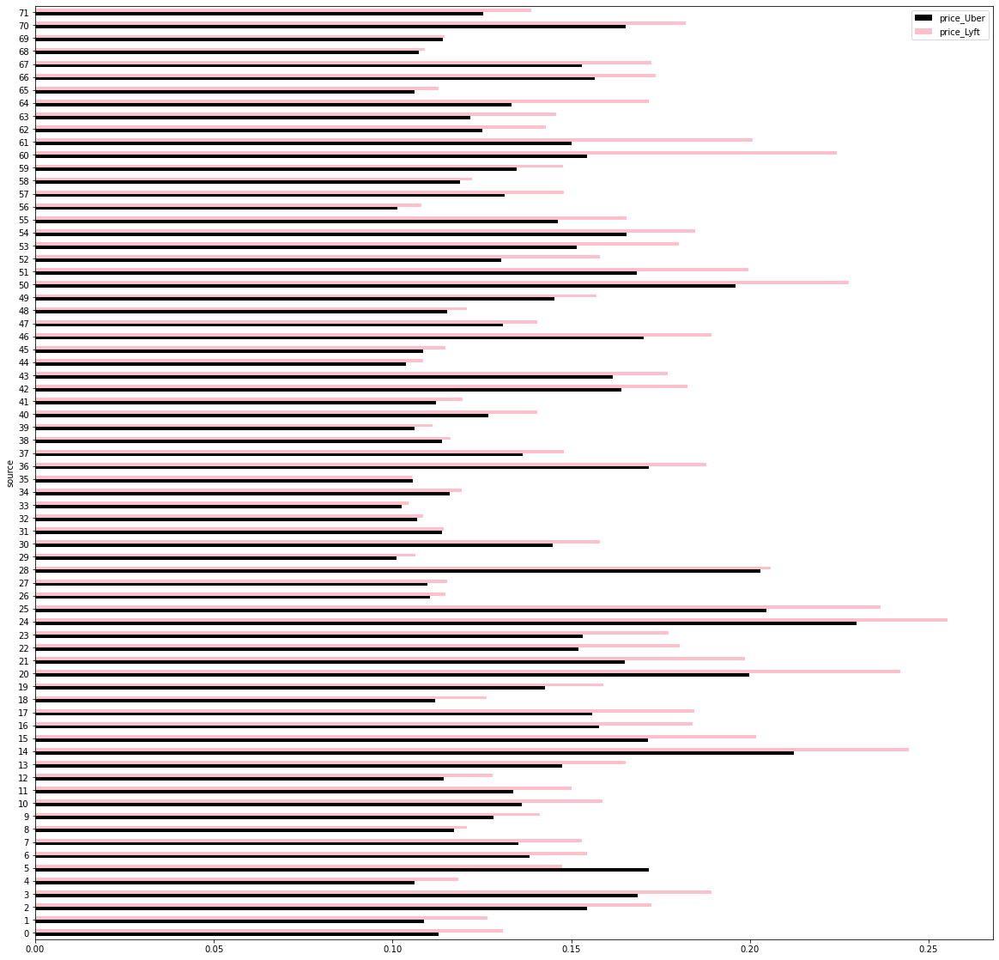

In [24]:
merged_data[["source","price_Uber","price_Lyft"]].plot(kind='barh', stacked=False, color=['Black', 'Pink'],figsize=(20, 20),xlabel='source',ylabel='price')

ValueError: Could not interpret input ''

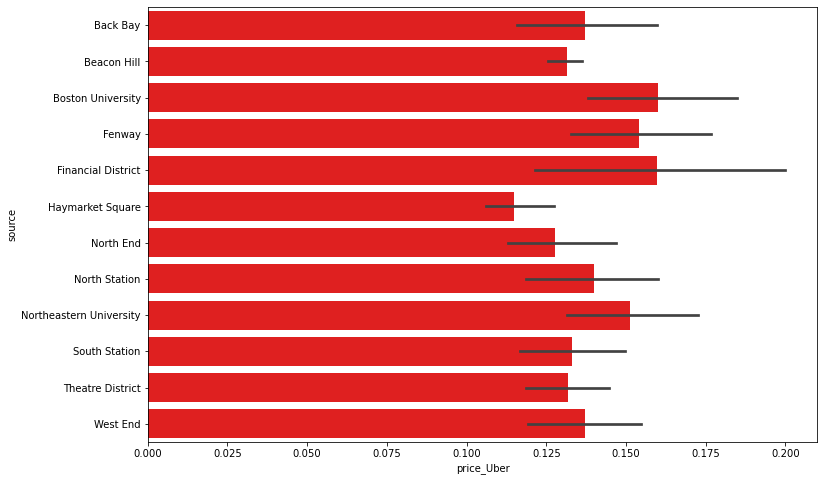

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'merged_data' is the DataFrame containing Uber and Lyft price comparison
# Replace 'your_dataset.csv' with your actual dataset file
# merged_data = pd.read_csv('your_dataset.csv')

# Set the figure size
plt.figure(figsize=(12, 8))

# Create a bar plot for Uber prices
sns.barplot(x='price_Uber', y='source', data=merged_data, color='red')

# Create a bar plot for Lyft prices
sns.barplot(x='price_Lyft', y='source', hue='', data=merged_data, color='blue')

# Set labels and title
plt.xlabel('Average Price')
plt.ylabel('Source')
plt.title('Comparison of Uber and Lyft Prices by Source and Destination')

# Show legend
plt.legend(labels=['Uber', 'Lyft'])

# Show the plot
plt.show()


In [26]:
plt.figure(figsize=(12, 8))
sns.pointplot(x='destination', y='price', hue='cab_type', data=merged_data, dodge=True, ci='sd')
plt.xlabel('Destination')
plt.ylabel('Average Price')
plt.title('Point Plot of Uber and Lyft Prices by Destination')
plt.legend(title='Cab Type')
plt.show()


ValueError: Could not interpret input 'price'

<Figure size 864x576 with 0 Axes>

In [27]:
plt.figure(figsize=(12, 8))
sns.pointplot(x='destination', y='price_Uber', hue='cab_type', data=merged_data, dodge=True, ci='sd')
plt.xlabel('Destination')
plt.ylabel('Average Price (Uber)')
plt.title('Point Plot of Uber Prices by Destination')
plt.legend(title='Cab Type')
plt.show()

plt.figure(figsize=(12, 8))
sns.pointplot(x='destination', y='price_Lyft', hue='cab_type', data=merged_data, dodge=True, ci='sd')
plt.xlabel('Destination')
plt.ylabel('Average Price (Lyft)')
plt.title('Point Plot of Lyft Prices by Destination')
plt.legend(title='Cab Type')
plt.show()


ValueError: Could not interpret input 'cab_type'

<Figure size 864x576 with 0 Axes>

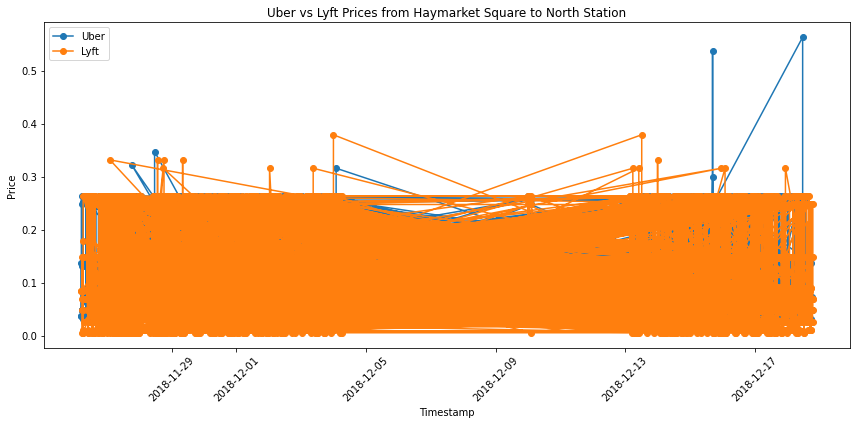

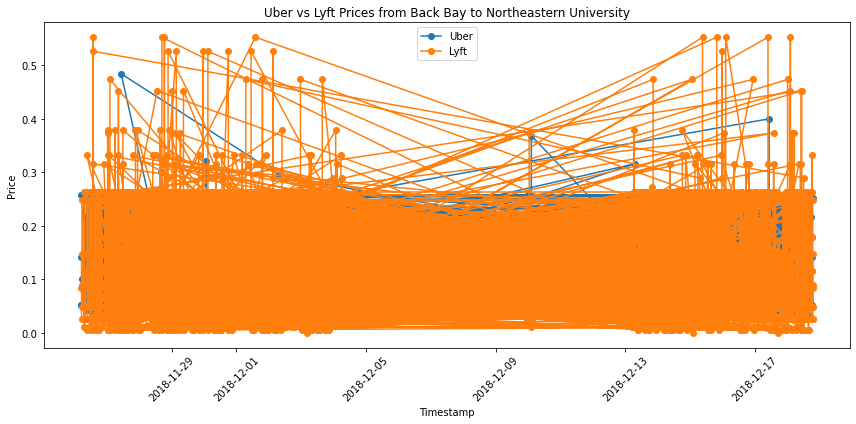

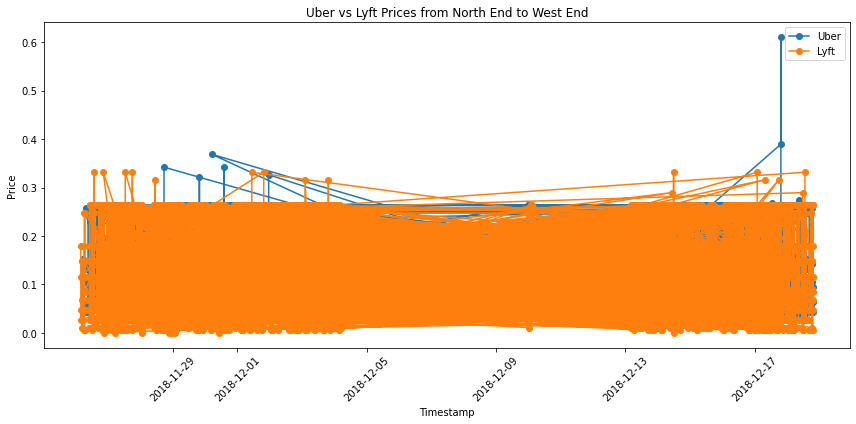

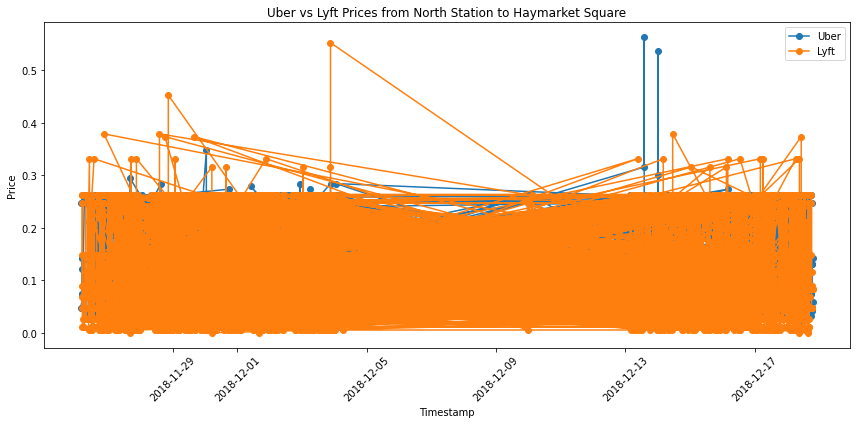

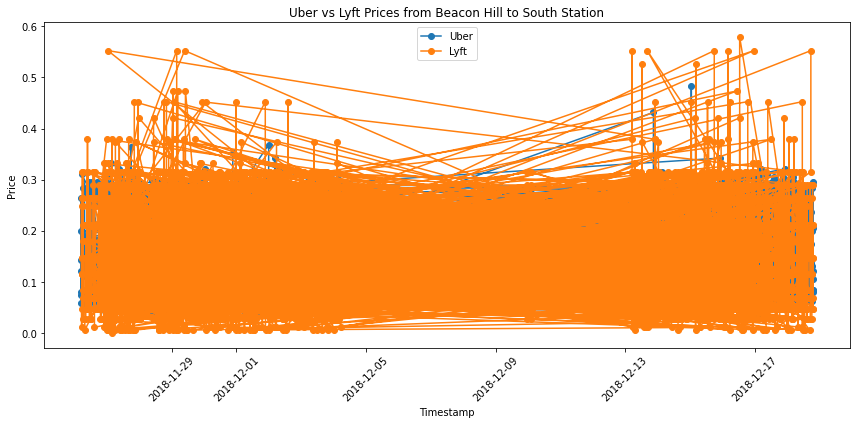

...

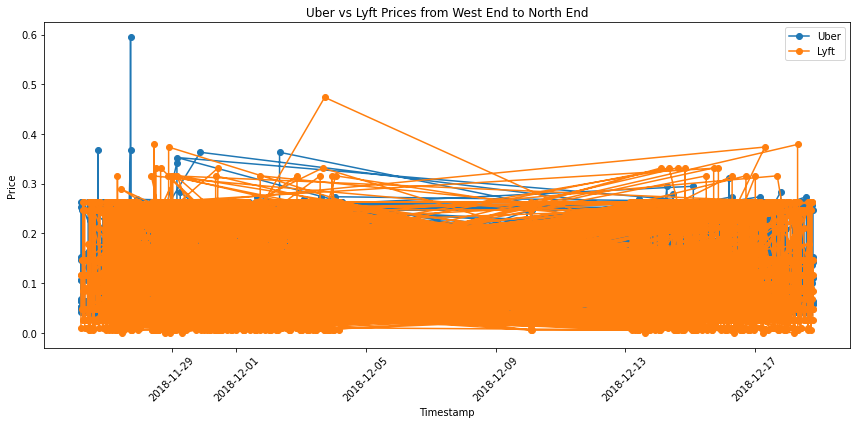

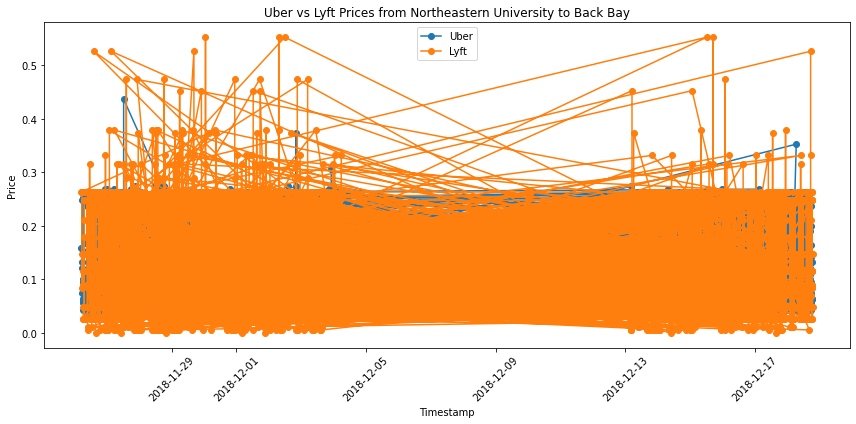

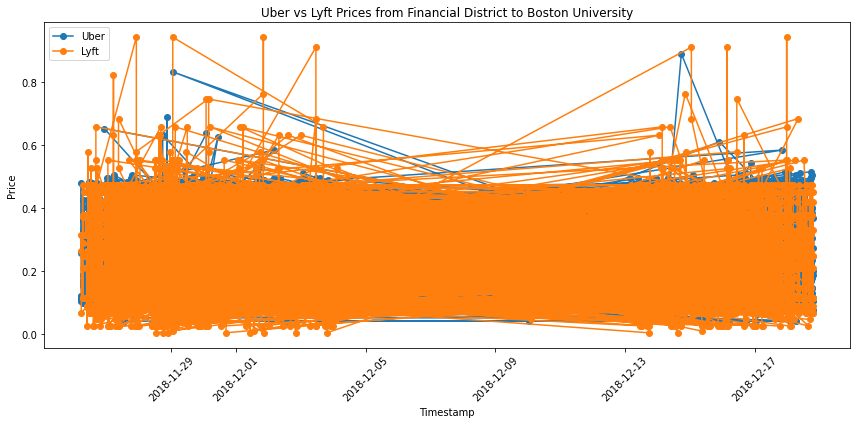

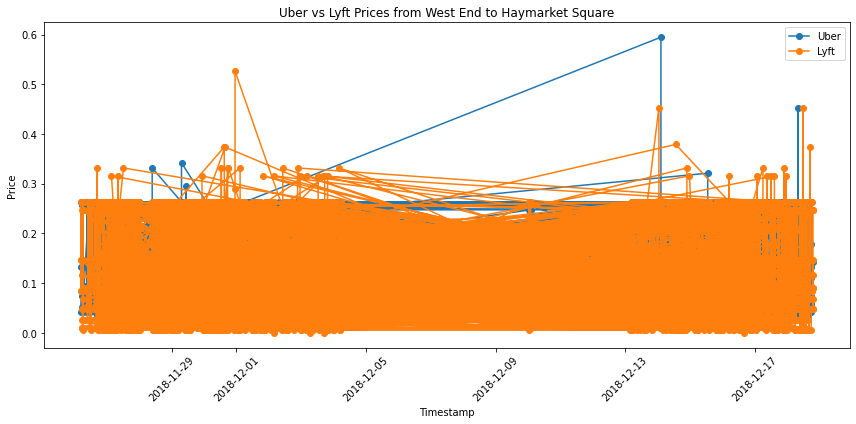

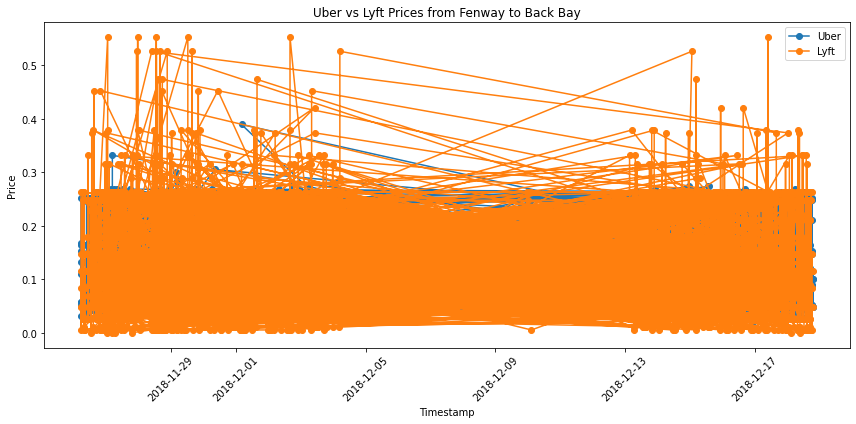

In [28]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming the dataset is loaded into the variable 'df'

# Extract unique source and destination pairs from the dataset
source_destination_pairs = df[['source', 'destination']].drop_duplicates()

# Iterate through each unique pair and create a plot
for index, pair in source_destination_pairs.iterrows():
    source_location = pair['source']
    destination_location = pair['destination']

    # Filter data for the specific source and destination
    filtered_df = df[(df['source'] == source_location) & (df['destination'] == destination_location)]

    # Filter data for Uber and Lyft
    uber_df = filtered_df[filtered_df['cab_type'] == 'Uber']
    lyft_df = filtered_df[filtered_df['cab_type'] == 'Lyft']

    # Plotting
    plt.figure(figsize=(12, 6))
    plt.plot(uber_df['timestamp'], uber_df['price'], label='Uber', marker='o')
    plt.plot(lyft_df['timestamp'], lyft_df['price'], label='Lyft', marker='o')

    # Customize the plot
    plt.title(f'Uber vs Lyft Prices from {source_location} to {destination_location}')
    plt.xlabel('Timestamp')
    plt.ylabel('Price')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()

    # Show the plot
    plt.show()


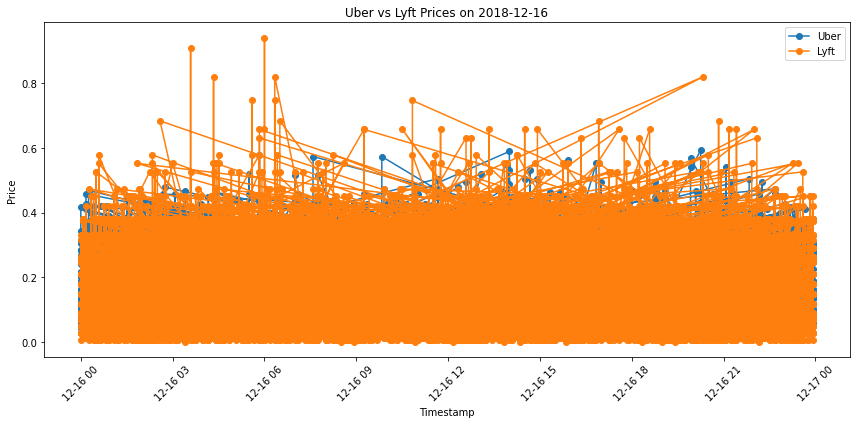

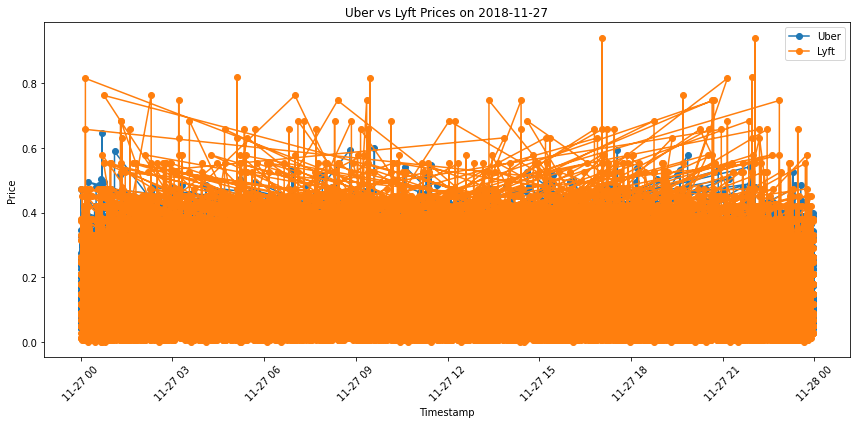

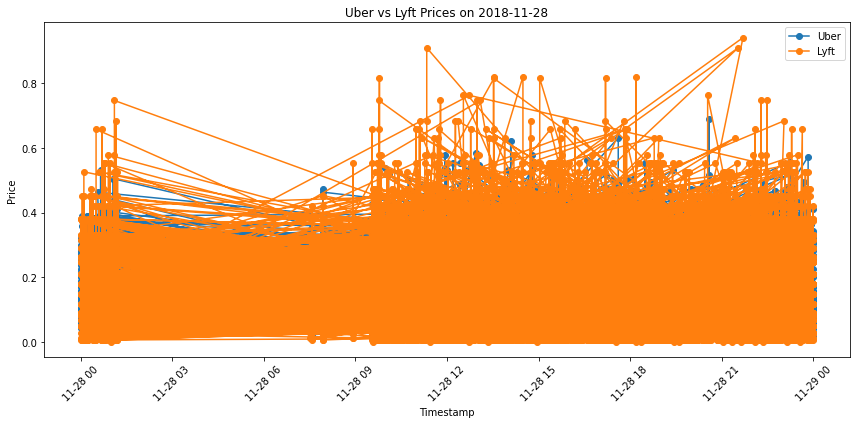

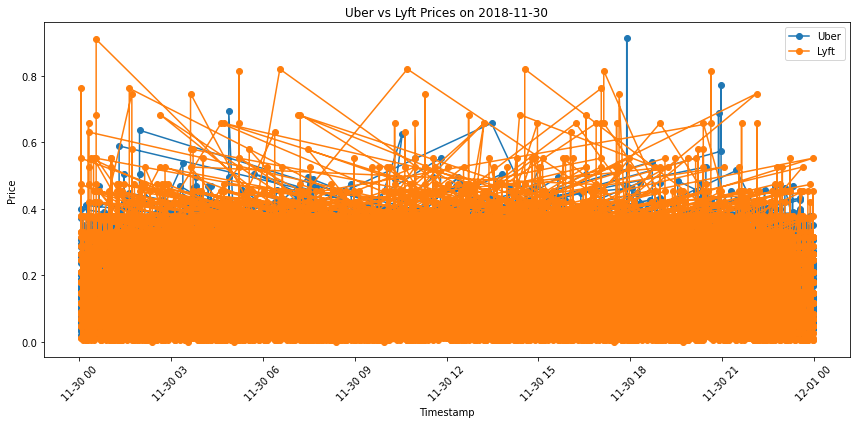

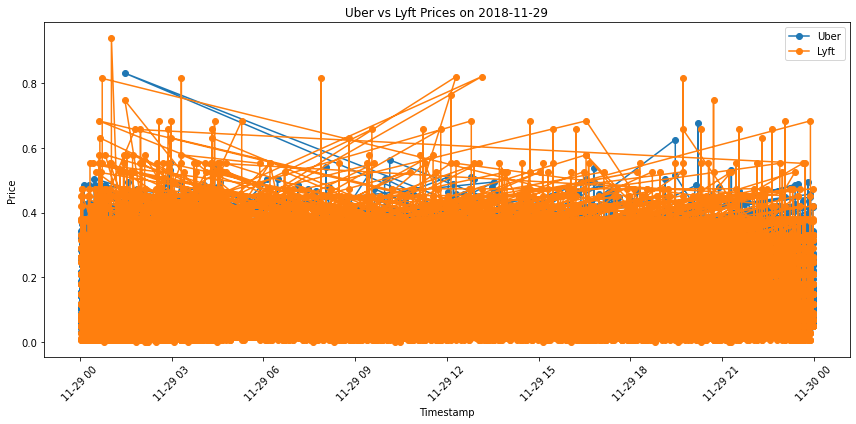

...

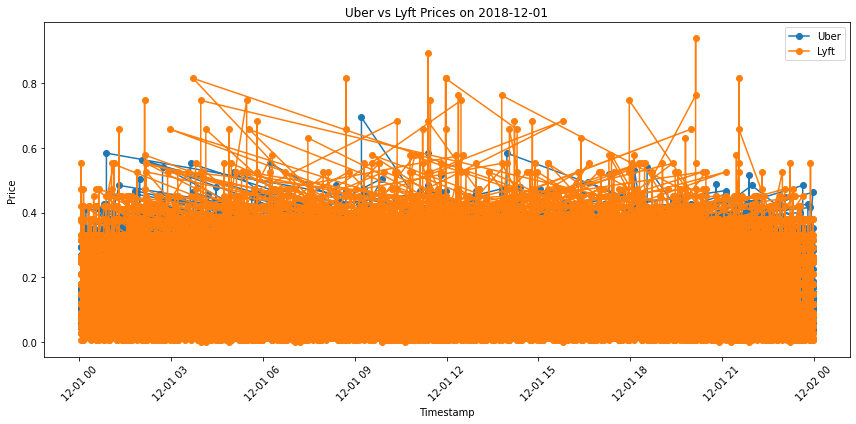

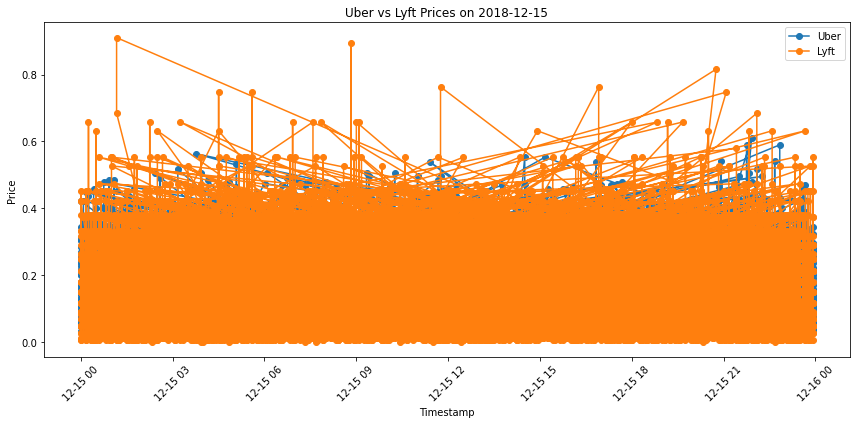

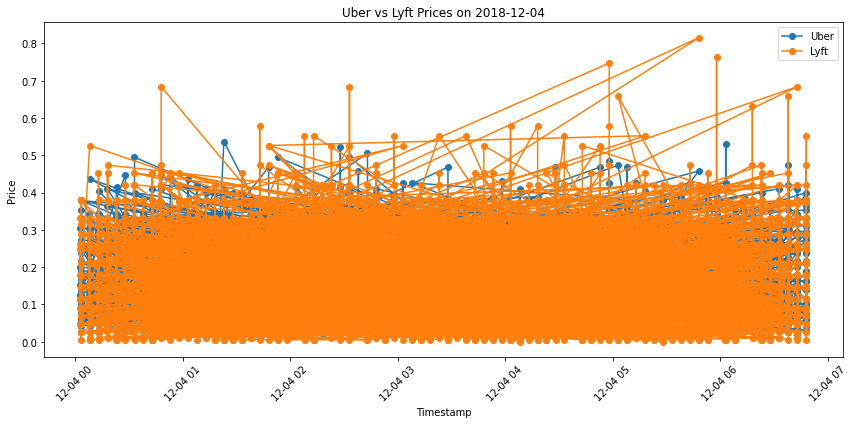

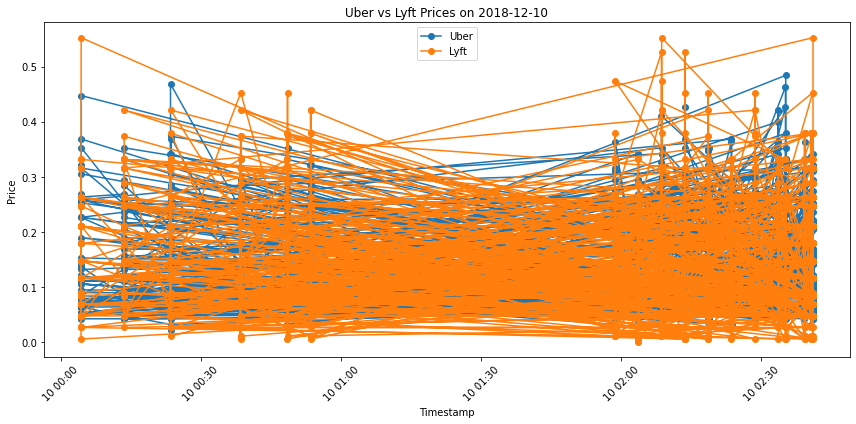

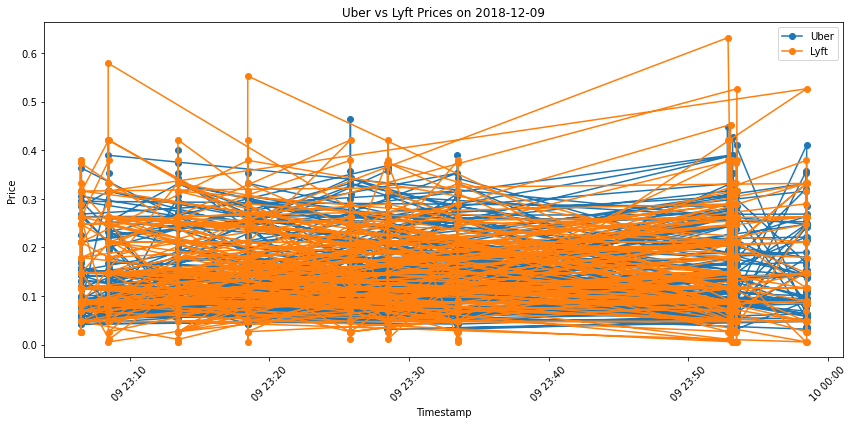

In [29]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming the dataset is loaded into the variable 'df'

# Extract unique dates from the 'timestamp' column
unique_dates = pd.to_datetime(df['timestamp']).dt.date.unique()

# Iterate through each unique date and create a plot
for date in unique_dates:
    # Filter data for the specific date
    date_df = df[pd.to_datetime(df['timestamp']).dt.date == date]

    # Filter data for Uber and Lyft
    uber_df = date_df[date_df['cab_type'] == 'Uber']
    lyft_df = date_df[date_df['cab_type'] == 'Lyft']

    # Plotting
    plt.figure(figsize=(12, 6))
    plt.plot(uber_df['timestamp'], uber_df['price'], label='Uber', marker='o')
    plt.plot(lyft_df['timestamp'], lyft_df['price'], label='Lyft', marker='o')

    # Customize the plot
    plt.title(f'Uber vs Lyft Prices on {date}')
    plt.xlabel('Timestamp')
    plt.ylabel('Price')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()

    # Show the plot
    plt.show()


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming the dataset is loaded into the variable 'df'

# Extract unique dates from the 'timestamp' column
unique_dates = pd.to_datetime(df['timestamp']).dt.date.unique()

# Initialize lists to store average prices for Uber and Lyft for each date
uber_avg_prices = []
lyft_avg_prices = []

# Iterate through each unique date
for date in unique_dates:
    # Filter data for the specific date
    date_df = df[pd.to_datetime(df['timestamp']).dt.date == date]

    # Filter data for Uber and Lyft
    uber_df = date_df[date_df['cab_type'] == 'Uber']
    lyft_df = date_df[date_df['cab_type'] == 'Lyft']

    # Calculate average prices for Uber and Lyft on the date
    uber_avg_price = uber_df['price'].mean()
    lyft_avg_price = lyft_df['price'].mean()

    # Append average prices to the lists
    uber_avg_prices.append(uber_avg_price)
    lyft_avg_prices.append(lyft_avg_price)

# Create a bar graph
plt.figure(figsize=(12, 6))
bar_width = 0.35
bar_positions = range(len(unique_dates))

plt.bar(bar_positions, uber_avg_prices, width=bar_width, label='Uber', align='center')
plt.bar([pos + bar_width for pos in bar_positions], lyft_avg_prices, width=bar_width, label='Lyft', align='center')

# Customize the plot
plt.title('Average Uber and Lyft Prices by Date')
plt.xlabel('Date')
plt.ylabel('Average Price')
plt.xticks(bar_positions, unique_dates, rotation=45)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd

# Assuming 'df' is your DataFrame containing the dataset

# Filter data for the specified time ranges
evening_rush_data = df[(df['hour'] == 17) | (df['hour'] == 18)]
late_night_data = df[(df['hour'] == 23) | (df['hour'] == 0)]

# Filter data for Uber and Lyft
uber_data = evening_rush_data[evening_rush_data['cab_type'] == 'Uber']
lyft_data = evening_rush_data[evening_rush_data['cab_type'] == 'Lyft']

# Assuming you have 'source' and 'destination' variables
# Replace 'your_source' and 'your_destination' with the actual values

# Display the prices for each combination of source and destination for Uber and Lyft
for source in df['source'].unique():
    for destination in df['destination'].unique():
        uber_destination_data = uber_data[(uber_data['source'] == source) & (uber_data['destination'] == destination)]
        lyft_destination_data = lyft_data[(lyft_data['source'] == source) & (lyft_data['destination'] == destination)]

        if not uber_destination_data.empty or not lyft_destination_data.empty:
            print(f"\nSource: {source}, Destination: {destination}")
            print("Uber Prices:")
            print(uber_destination_data[['timestamp', 'price']])

            print("\nLyft Prices:")
            print(lyft_destination_data[['timestamp', 'price']])


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame containing the dataset

# ... (your previous code)

# Display the prices for each combination of source and destination for Uber and Lyft
for source in df['source'].unique():
    for destination in df['destination'].unique():
        uber_destination_data = uber_data[(uber_data['source'] == source) & (uber_data['destination'] == destination)]
        lyft_destination_data = lyft_data[(lyft_data['source'] == source) & (lyft_data['destination'] == destination)]

        if not uber_destination_data.empty or not lyft_destination_data.empty:
            # Plotting Uber Prices
            plt.figure(figsize=(10, 5))
            plt.plot(uber_destination_data['timestamp'], uber_destination_data['price'], label='Uber', marker='o')

            # Plotting Lyft Prices
            plt.plot(lyft_destination_data['timestamp'], lyft_destination_data['price'], label='Lyft', marker='o')

            # Adding labels and title
            plt.xlabel('Timestamp')
            plt.ylabel('Price')
            plt.title(f"Prices from {source} to {destination}")
            plt.legend()
            plt.show()


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame containing the dataset

# ... (your previous code)

# Display the prices for each combination of source and destination for Uber and Lyft
for source in df['source'].unique():
    for destination in df['destination'].unique():
        uber_destination_data = uber_data[(uber_data['source'] == source) & (uber_data['destination'] == destination)]
        lyft_destination_data = lyft_data[(lyft_data['source'] == source) & (lyft_data['destination'] == destination)]

        if not uber_destination_data.empty or not lyft_destination_data.empty:
            # Plotting Uber Prices
            plt.figure(figsize=(10, 5))
            plt.plot(uber_destination_data['hour'], uber_destination_data['price'], label='Uber', marker='o')

            # Plotting Lyft Prices
            plt.plot(lyft_destination_data['hour'], lyft_destination_data['price'], label='Lyft', marker='o')

            # Adding labels and title
            plt.xlabel('Hour')
            plt.ylabel('Price')
            plt.title(f"Prices from {source} to {destination}")
            plt.legend()
            plt.show()


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'df' is your DataFrame containing the dataset

# ... (your previous code)

# Display the prices for each combination of source and destination for Uber and Lyft
for source in df['source'].unique():
    for destination in df['destination'].unique():
        uber_destination_data = uber_data[(uber_data['source'] == source) & (uber_data['destination'] == destination)]
        lyft_destination_data = lyft_data[(lyft_data['source'] == source) & (lyft_data['destination'] == destination)]

        if not uber_destination_data.empty or not lyft_destination_data.empty:
            # Bar graph for Uber Prices
            plt.figure(figsize=(10, 5))
            bar_width = 0.35
            index = np.arange(len(uber_destination_data))
            plt.bar(index, uber_destination_data['price'], bar_width, label='Uber')

            # Bar graph for Lyft Prices
            plt.bar(index + bar_width, lyft_destination_data['price'], bar_width, label='Lyft')

            # Adding labels and title
            plt.xlabel('Hour')
            plt.ylabel('Price')
            plt.title(f"Prices from {source} to {destination}")
            plt.xticks(index + bar_width / 2, uber_destination_data['hour'])
            plt.legend()
            plt.show()


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'df' is your DataFrame containing the dataset

# Filter data for the specified time ranges
evening_rush_data = df[(df['hour'].isin([15, 16, 17, 18, 23]))]
uber_data = evening_rush_data[evening_rush_data['cab_type'] == 'Uber']
lyft_data = evening_rush_data[evening_rush_data['cab_type'] == 'Lyft']

# Display the prices for each hour for Uber and Lyft
hours_to_display = [15, 16, 17, 18, 23]

for hour in hours_to_display:
    uber_hour_data = uber_data[uber_data['hour'] == hour]
    lyft_hour_data = lyft_data[lyft_data['hour'] == hour]

    if not uber_hour_data.empty or not lyft_hour_data.empty:
        # Bar graph for Uber and Lyft Prices
        plt.figure(figsize=(10, 5))
        bar_width = 0.35
        index = np.arange(len(uber_hour_data))
        plt.bar(index, uber_hour_data['price'], bar_width, label='Uber')

        # Adjust the index for Lyft bars
        plt.bar(index + bar_width, lyft_hour_data['price'], bar_width, label='Lyft')

        # Adding labels and title
        plt.xlabel('Hour')
        plt.ylabel('Price')
        plt.title(f"Prices for Uber and Lyft at {hour}:00")
        plt.xticks(index + bar_width / 2, uber_hour_data['hour'])
        plt.legend()
        plt.show()

        

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame containing the dataset

# Filter data for Uber and Lyft
uber_data = df[df['cab_type'] == 'Uber']
lyft_data = df[df['cab_type'] == 'Lyft']

# Pivot the data for Uber
uber_pivot = uber_data.pivot_table(index='hour', columns='source', values='price', aggfunc='mean')

# Pivot the data for Lyft
lyft_pivot = lyft_data.pivot_table(index='hour', columns='source', values='price', aggfunc='mean')

# Create heatmaps for Uber and Lyft
plt.figure(figsize=(15, 6))

plt.subplot(1, 2, 1)
sns.heatmap(uber_pivot, cmap='YlGnBu', annot=True, fmt=".2f", cbar_kws={'label': 'Uber Price'})
plt.title('Uber Prices by Hour')

plt.subplot(1, 2, 2)
sns.heatmap(lyft_pivot, cmap='YlGnBu', annot=True, fmt=".2f", cbar_kws={'label': 'Lyft Price'})
plt.title('Lyft Prices by Hour')

plt.tight_layout()
plt.show()
